Mounted at /content/drive
[Train]  Counter({'early': 800, 'late': 800, 'healthy': 121})
[Val]    Counter({'late': 100, 'early': 100, 'healthy': 15})
[Test]   Counter({'late': 100, 'early': 100, 'healthy': 16})


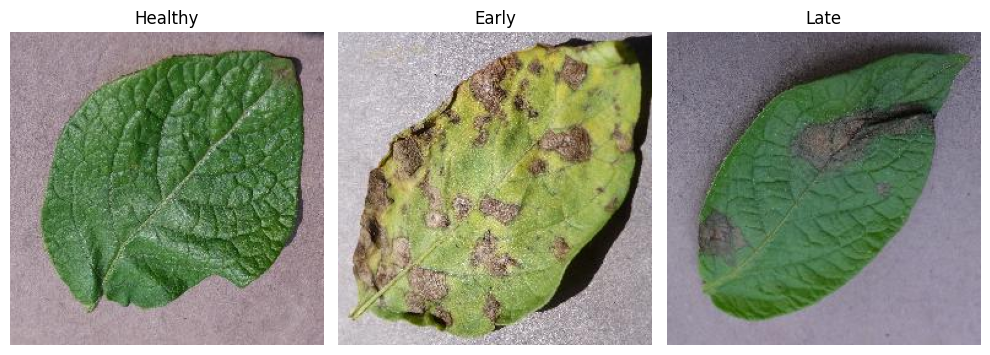

In [ ]:
# 라이브러리 임포트

import os
import glob
import gc
import shutil
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import seaborn as sns
from matplotlib.image import imread
from matplotlib.pyplot import imshow
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D,Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.regularizers import l1_l2
from tensorflow.keras.utils import load_img
from tensorflow.keras.applications import VGG16,EfficientNetB0,ResNet50,MobileNetV2
from tensorflow.keras.optimizers.schedules import CosineDecay
from sklearn.metrics import classification_report, confusion_matrix

import os
import warnings
warnings.filterwarnings('ignore')

# 드라이브 마운트 후, 데이터셋 압축 해제
from google.colab import drive
drive.mount('/content/drive')

#압축해제
import zipfile

zip_file = zipfile.ZipFile('/content/drive/MyDrive/kaggle/patato-plant-disease.zip', 'r')
extract_dir = 'potato-plant-disease'
zip_file.extractall(extract_dir)

# 원본 이미지 경로 로딩
healthy_dir = glob.glob("potato-plant-disease/PlantVillage/PlantVillage/Potato___healthy/*")
late_blight_dir =  glob.glob("potato-plant-disease/PlantVillage/PlantVillage/Potato___Late_blight/*")
early_blight_dir =  glob.glob("potato-plant-disease/PlantVillage/PlantVillage/Potato___Early_blight/*")



# 전체 이미지 리스트를 (경로, 클래스명) 형태로 합치기
image_list = [(path, 'healthy') for path in healthy_dir] + \
             [(path, 'late') for path in late_blight_dir] + \
             [(path, 'early') for path in early_blight_dir]


def split_data(image_list_with_labels, train_ratio=0.8, val_ratio=0.1, test_ratio=0.1, seed=42):
    image_paths = [x[0] for x in image_list_with_labels]
    labels = [x[1] for x in image_list_with_labels]

    # train vs temp(val+test)
    train_paths, temp_paths, train_labels, temp_labels = train_test_split(
        image_paths, labels, test_size=(1 - train_ratio), stratify=labels, random_state=seed
    )

    # val vs test
    val_ratio_adjusted = val_ratio / (val_ratio + test_ratio)
    val_paths, test_paths, val_labels, test_labels = train_test_split(
        temp_paths, temp_labels, test_size=(1 - val_ratio_adjusted), stratify=temp_labels, random_state=seed
    )

    # 다시 묶어서 반환
    train = list(zip(train_paths, train_labels))
    val = list(zip(val_paths, val_labels))
    test = list(zip(test_paths, test_labels))

    return train, val, test

train, val, test = split_data(image_list)


from collections import Counter

print("[Train] ", Counter([label for _, label in train]))
print("[Val]   ", Counter([label for _, label in val]))
print("[Test]  ", Counter([label for _, label in test]))

# 클래스별 첫 이미지 경로 추출
sample_images = {}
for cls in ['healthy', 'early', 'late']:
    for path, label in image_list:
        if label == cls:
            sample_images[cls] = path
            break  # 첫 이미지만

# 시각화
fig, ax = plt.subplots(1, 3, figsize=(10, 4))

for i, cls in enumerate(['healthy', 'early', 'late']):
    img = imread(sample_images[cls])
    ax[i].imshow(img)
    ax[i].set_title(cls.capitalize())
    ax[i].axis('off')

plt.tight_layout()
plt.show()


The image numbers of Healthy : 152
The image numbers of Late Blight  : 1000
The image numbers of Early Blight  : 1000


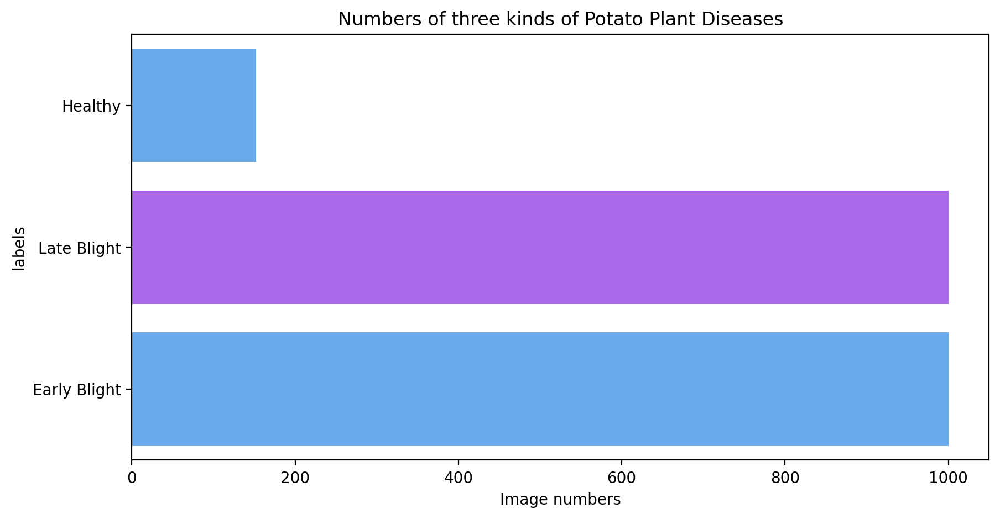

In [ ]:

# Definition of 3 types of Potato Plant
num_h = len(os.listdir('/content/potato-plant-disease/PlantVillage/PlantVillage/Potato___healthy'))
num_l = len(os.listdir('/content/potato-plant-disease/PlantVillage/PlantVillage/Potato___Late_blight'))
num_e = len(os.listdir('/content/potato-plant-disease/PlantVillage/PlantVillage/Potato___Early_blight'))

df = pd.DataFrame({'labels' : ['Healthy', 'Late Blight', 'Early Blight'],
'Image numbers' : [num_h, num_l, num_e]})

print(f"The image numbers of Healthy : {num_h}")
print(f"The image numbers of Late Blight  : {num_l}")
print(f"The image numbers of Early Blight  : {num_e}")

# 데이터 클래스 분포 확인
palette1 = sns.color_palette('cool',2)
plt.figure(figsize=(10,5), dpi=200)
sns.barplot(df, y='labels', x='Image numbers', palette=palette1)
plt.title('Numbers of three kinds of Potato Plant Diseases')
plt.show()




In [ ]:

def move_file(file_label_list, destination_root):
    for file_path, label in file_label_list:
        label_folder = os.path.join(destination_root, label)
        os.makedirs(label_folder, exist_ok=True)
        shutil.copy(file_path, os.path.join(label_folder, os.path.basename(file_path)))

# 이동
move_file(train, '/content/train')
move_file(val, '/content/val')
move_file(test, '/content/test')
healthy_src = '/content/train/healthy'
healthy_dst = '/content/train_augmented/healthy'

# Early, Late는 그대로 복사
for label in ['early', 'late']:
    shutil.copytree(f'/content/train/{label}', f'/content/train_augmented/{label}', dirs_exist_ok=True)

# Healthy 증강
os.makedirs(healthy_dst, exist_ok=True)
from tensorflow.keras.preprocessing.image import ImageDataGenerator

aug = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.2,
    brightness_range=[0.7, 1.3],
    horizontal_flip=True,
    fill_mode='nearest'
)

healthy_imgs = os.listdir(healthy_src)
for img in healthy_imgs:
    img_path = os.path.join(healthy_src, img)
    x = img_to_array(load_img(img_path, target_size=(224, 224)))
    x = x.reshape((1,) + x.shape)

    # 5개씩 생성
    i = 0
    for batch in aug.flow(x, batch_size=1, save_to_dir=healthy_dst, save_prefix='aug', save_format='jpg'):
        i += 1
        if i >= 5:
            break
    # 원본도 복사
    shutil.copy(img_path, os.path.join(healthy_dst, os.path.basename(img)))

# 데이터 셋 분류
train_gen = ImageDataGenerator(rescale=1/255).flow_from_directory(
    '/content/train_augmented', target_size=(224, 224), batch_size=64, class_mode='sparse'
)
val_gen = ImageDataGenerator(rescale=1/255).flow_from_directory(
    '/content/val', target_size=(224, 224), batch_size=64, class_mode='sparse'
)
test_gen = ImageDataGenerator(rescale=1/255).flow_from_directory(
    '/content/test', target_size=(224, 224), batch_size=64, class_mode='sparse', shuffle=False
)


Found 2310 images belonging to 3 classes.
Found 215 images belonging to 3 classes.
Found 216 images belonging to 3 classes.


In [ ]:
from tensorflow.keras.applications import MobileNetV2, VGG16, ResNet50, EfficientNetB0
from tensorflow.keras.optimizers.schedules import CosineDecay
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization

def build_model(base_model_fn,input_shape=(224, 224, 3), num_classes=3):

    base_model = base_model_fn(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    inputs = Input(shape=input_shape)
    x = base_model(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)

    lr_schedule = CosineDecay(initial_learning_rate=0.001, decay_steps=100, alpha=0.0001)
    model.compile(optimizer=Adam(learning_rate=lr_schedule),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model


In [ ]:
import matplotlib.pyplot as plt

def show_predictions(model, test_gen, class_indices, num_images=10):
    # 역으로 클래스 인덱스를 이름으로 매핑
    idx_to_class = {v: k for k, v in class_indices.items()}

    # 이미지, 정답 추출
    images, true_labels = next(test_gen)  # 한 배치만 가져옴 (64개)
    preds = model.predict(images)
    pred_labels = np.argmax(preds, axis=1)

    plt.figure(figsize=(15, 8))
    for i in range(num_images):
        plt.subplot(2, num_images // 2, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
        plt.title(f"Pred: {idx_to_class[pred_labels[i]]}\nTrue: {idx_to_class[int(true_labels[i])]}")
    plt.tight_layout()
    plt.show()


 Training VGG16 on ORIGINAL data
Found 1721 images belonging to 3 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 26s 586ms/step - accuracy: 0.6894 - loss: 0.6356 - val_accuracy: 0.4651 - val_loss: 1.0130
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - accuracy: 0.9412 - loss: 0.1802 - val_accuracy: 0.6140 - val_loss: 0.6975
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - accuracy: 0.9572 - loss: 0.1302 - val_accuracy: 0.6884 - val_loss: 0.6257
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 129ms/step - accuracy: 0.9645 - loss: 0.1218 - val_accuracy: 0.7860 - val_loss: 0.5689
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 126ms/step - accuracy: 0.9560 - loss: 0.1376 - val_accuracy: 0.8512 - val_loss: 0.5190
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 297ms/step - accuracy: 0.9016 - loss: 0.4098
VGG16 accuracy : 0.8842592835426331
VGG16 loss : 0.48208123445510864
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step


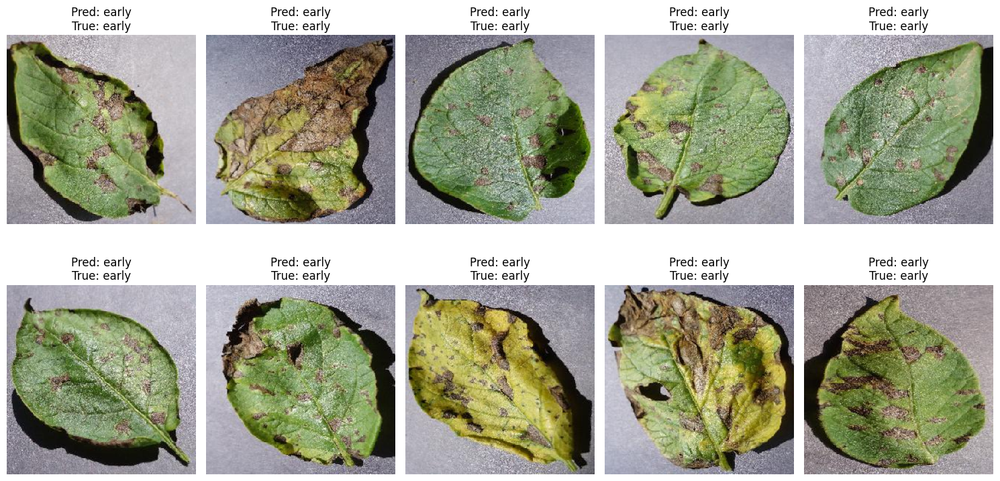


 Training VGG16 on AUGMENTED data
Found 2310 images belonging to 3 classes.
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 12s 248ms/step - accuracy: 0.7547 - loss: 0.5242 - val_accuracy: 0.6419 - val_loss: 0.7035
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 116ms/step - accuracy: 0.9451 - loss: 0.1422 - val_accuracy: 0.9116 - val_loss: 0.5853
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 117ms/step - accuracy: 0.9651 - loss: 0.1105 - val_accuracy: 0.9209 - val_loss: 0.5292
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - accuracy: 0.9628 - loss: 0.1170 - val_accuracy: 0.9256 - val_loss: 0.4787
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step - accuracy: 0.9596 - loss: 0.1244 - val_accuracy: 0.9349 - val_loss: 0.4289
3/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step 

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 274ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 255ms/step - accuracy: 0.9525 - loss: 0.3856
VGG16 accuracy : 0.9490740895271301
VGG16 loss : 0.4042862057685852


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step 


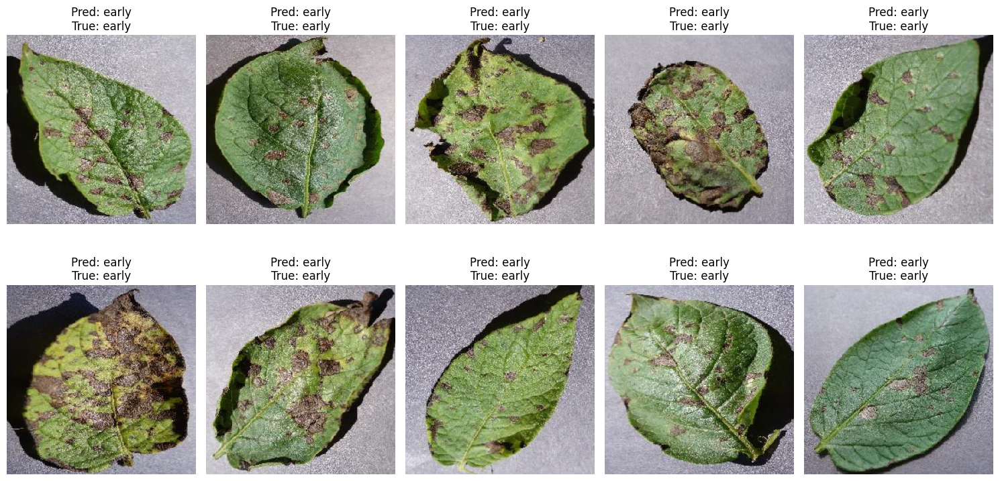


 Training ResNet50 on ORIGINAL data
Found 1721 images belonging to 3 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 32s 681ms/step - accuracy: 0.7102 - loss: 0.7065 - val_accuracy: 0.4930 - val_loss: 0.8921
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - accuracy: 0.8783 - loss: 0.3822 - val_accuracy: 0.5721 - val_loss: 0.8405
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - accuracy: 0.8749 - loss: 0.3589 - val_accuracy: 0.6326 - val_loss: 0.8081
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 133ms/step - accuracy: 0.8920 - loss: 0.3201 - val_accuracy: 0.6605 - val_loss: 0.7825
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - accuracy: 0.9084 - loss: 0.2937 - val_accuracy: 0.6977 - val_loss: 0.7519
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 659ms/step - accuracy: 0.8150 - loss: 0.6741
ResNet50 accuracy : 0.7314814925193787
ResNet50 loss : 0.7454834580421448
2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step


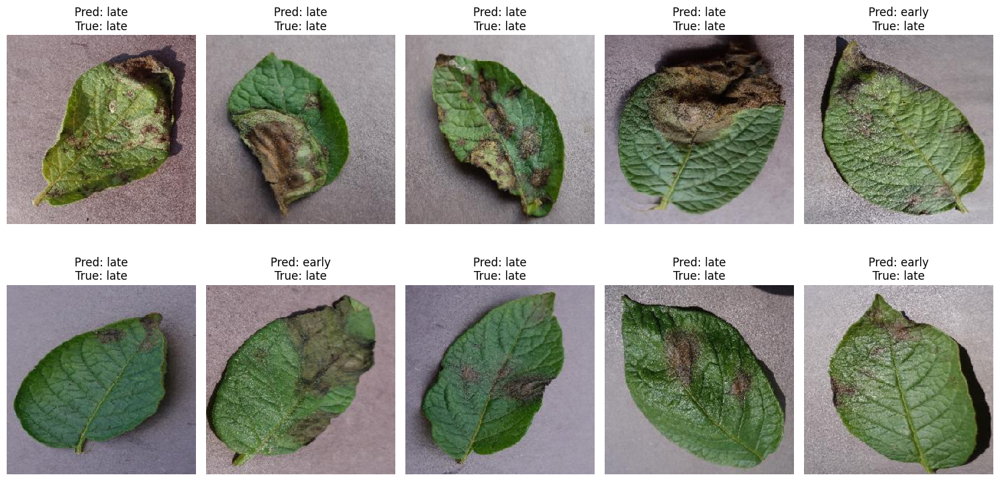


 Training ResNet50 on AUGMENTED data
Found 2310 images belonging to 3 classes.
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 25s 399ms/step - accuracy: 0.6296 - loss: 0.8014 - val_accuracy: 0.4651 - val_loss: 0.8698
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8152 - loss: 0.4691 - val_accuracy: 0.4977 - val_loss: 0.8324
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - accuracy: 0.8314 - loss: 0.4393 - val_accuracy: 0.6140 - val_loss: 0.8081
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 126ms/step - accuracy: 0.8391 - loss: 0.4270 - val_accuracy: 0.7023 - val_loss: 0.7904
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step - accuracy: 0.8326 - loss: 0.4439 - val_accuracy: 0.7395 - val_loss: 0.7718
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 600ms/step - accuracy: 0.6932 - loss: 0.8003
ResNet50 accuracy : 0.7407407164573669
ResNet50 loss : 0.7674097418785095
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


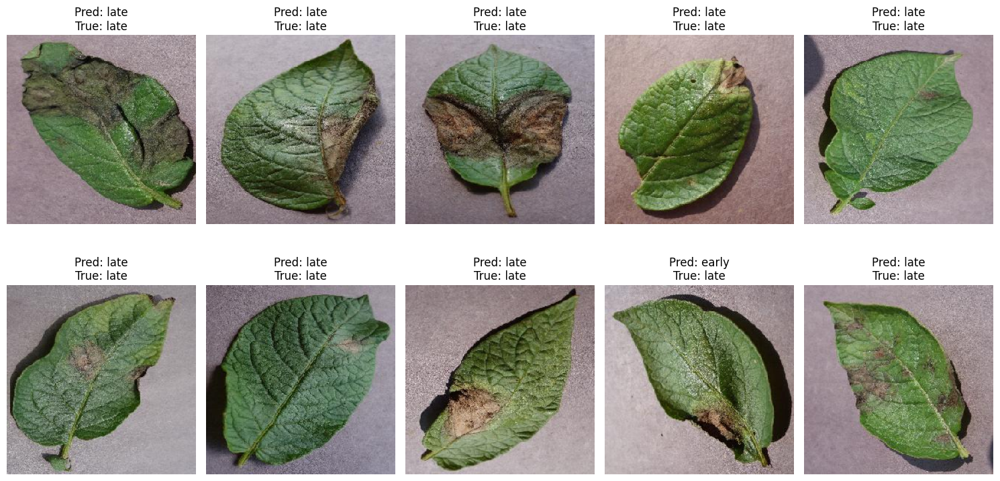


 Training MobileNetV2 on ORIGINAL data
Found 1721 images belonging to 3 classes.
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.8423 - loss: 0.4160 - val_accuracy: 0.8279 - val_loss: 0.5341
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step - accuracy: 0.9819 - loss: 0.0502 - val_accuracy: 0.9349 - val_loss: 0.1570
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - accuracy: 0.9966 - loss: 0.0219 - val_accuracy: 0.9442 - val_loss: 0.1314
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 131ms/step - accuracy: 0.9947 - loss: 0.0257 - val_accuracy: 0.9674 - val_loss: 0.1027
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - accuracy: 0.9998 - loss: 0.0148 - val_accuracy: 0.9721 - val_loss: 0.0908
4/4 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 716ms/step - accuracy: 0.9657 - loss: 0.1318
MobileNetV2 accuracy : 0.9675925970077515
MobileNetV2 loss : 0.11016511917114258
2/2 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step


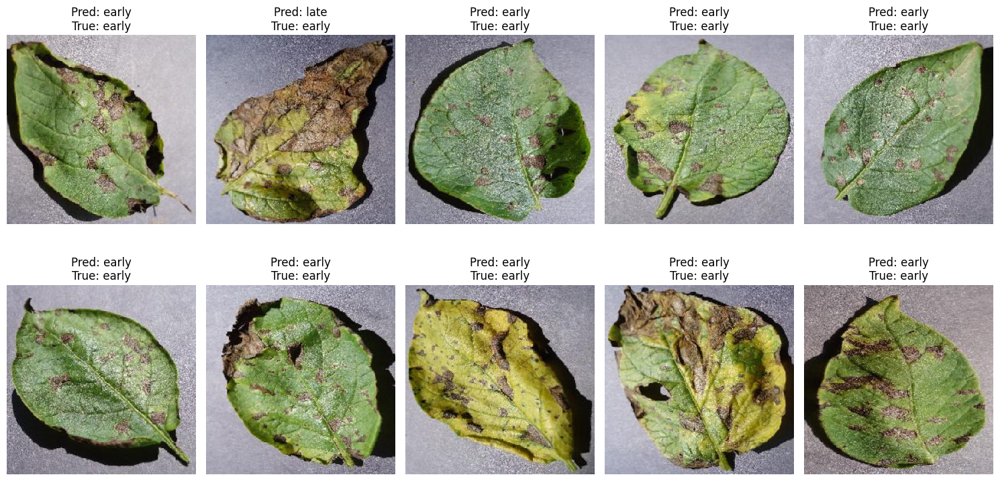


 Training MobileNetV2 on AUGMENTED data
Found 2310 images belonging to 3 classes.
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 25s 457ms/step - accuracy: 0.8873 - loss: 0.2946 - val_accuracy: 0.9581 - val_loss: 0.1405
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 123ms/step - accuracy: 0.9758 - loss: 0.0658 - val_accuracy: 0.9442 - val_loss: 0.1235
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - accuracy: 0.9907 - loss: 0.0308 - val_accuracy: 0.9674 - val_loss: 0.1065
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 119ms/step - accuracy: 0.9889 - loss: 0.0323 - val_accuracy: 0.9721 - val_loss: 0.0993
Epoch 5/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 123ms/step - accuracy: 0.9927 - loss: 0.0266 - val_accuracy: 0.9721 - val_loss: 0.0959
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1000ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 620ms/step - accuracy: 0.9630 - loss: 0.1127
MobileNetV2 accuracy : 0.9583333134651184
MobileNetV2 loss : 0.11750609427690506
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step


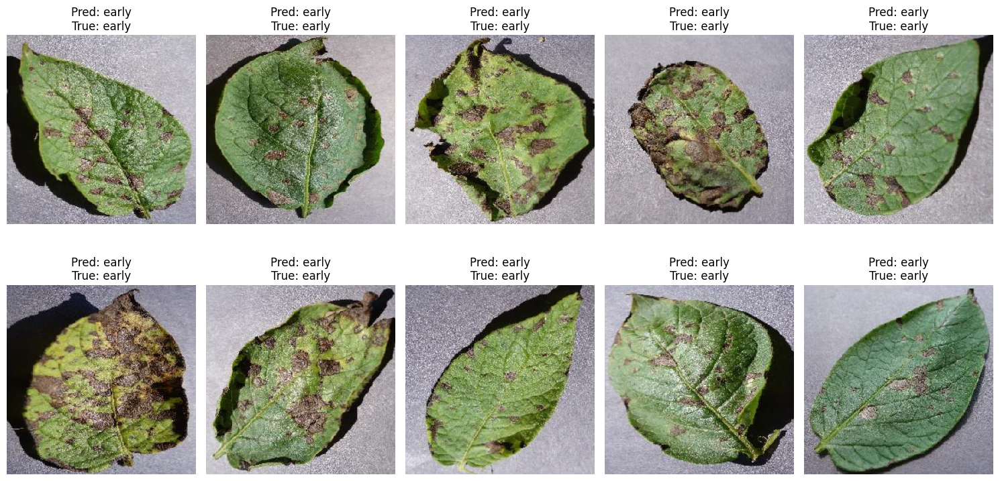


 Training EfficientNetB0 on ORIGINAL data
Found 1721 images belonging to 3 classes.
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.4016 - loss: 1.2246 - val_accuracy: 0.4651 - val_loss: 1.0222
Epoch 2/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 130ms/step - accuracy: 0.5117 - loss: 0.9503 - val_accuracy: 0.4651 - val_loss: 1.0053
Epoch 3/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - accuracy: 0.5146 - loss: 0.9362 - val_accuracy: 0.4651 - val_loss: 0.9148
Epoch 4/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - accuracy: 0.5801 - loss: 0.9056 - val_accuracy: 0.4651 - val_loss: 0.9081
Epoch 5/5
27/27 ━━━━━━━━━━━━━━━━━━━━ 4s 132ms/step - accuracy: 0.6074 - loss: 0.8932 - val_accuracy: 0.4651 - val_loss: 0.9068
4/4 ━━━━━━━━━━━━━━━━━━━━ 18s 4s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.2831 - loss: 0.9517
EfficientNetB0 accuracy : 0.46296295523643494
EfficientNetB0 loss : 0.9121593236923218
2/2 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/ste

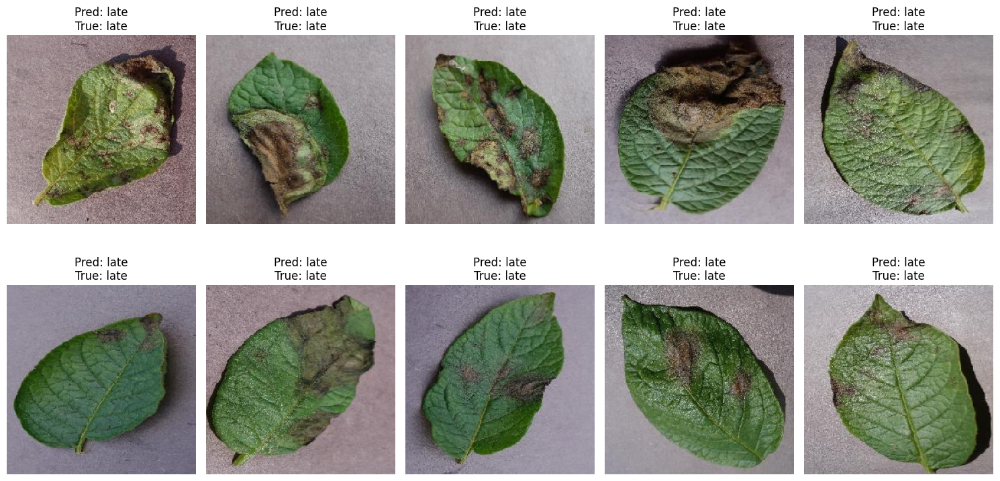


 Training EfficientNetB0 on AUGMENTED data
Found 2310 images belonging to 3 classes.
Epoch 1/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 46s 719ms/step - accuracy: 0.3808 - loss: 1.2441 - val_accuracy: 0.0698 - val_loss: 1.3416
Epoch 2/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - accuracy: 0.3636 - loss: 1.1224 - val_accuracy: 0.3488 - val_loss: 1.1604
Epoch 3/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - accuracy: 0.4362 - loss: 1.0921 - val_accuracy: 0.0698 - val_loss: 1.2049
Epoch 4/5
37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - accuracy: 0.4665 - loss: 1.0839 - val_accuracy: 0.0698 - val_loss: 1.1777
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.4793 - loss: 1.0916
EfficientNetB0 accuracy : 0.35185185074806213
EfficientNetB0 loss : 1.1589667797088623
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


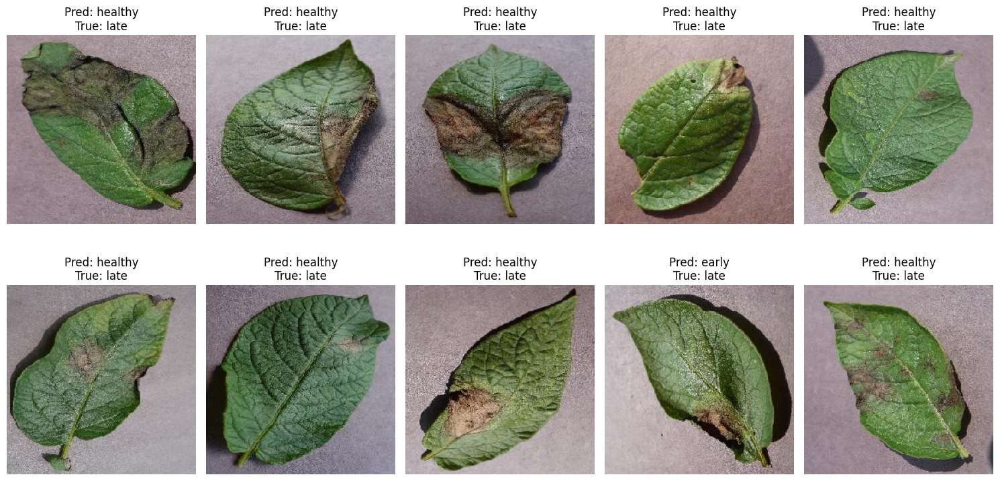

In [ ]:
results = {}  # e.g. results["VGG16"]["augmented"]["history"]


from copy import deepcopy

models_to_test = {
    "VGG16": VGG16,
    "ResNet50": ResNet50,
    "MobileNetV2": MobileNetV2,
    "EfficientNetB0": EfficientNetB0
}

for model_name, model_fn in models_to_test.items():
    results[model_name] = {}

    for mode in ["original", "augmented"]:
        print(f"\n Training {model_name} on {mode.upper()} data")

        train_path = "/content/train_augmented" if mode == "augmented" else "/content/train"

        # 데이터 생성기
        train_gen = ImageDataGenerator(rescale=1/255).flow_from_directory(
            train_path, target_size=(224, 224), batch_size=64, class_mode='sparse'
        )

        # 모델 빌드 및 학습
        model = build_model(model_fn)
        history = model.fit(train_gen, validation_data=val_gen, epochs=5,
                            callbacks=[EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)],
                            verbose=1)

        # 테스트 예측
        y_pred = np.argmax(model.predict(test_gen), axis=1)
        loss_res, accuracy_res = model.evaluate(test_gen)

        print(f"{model_name} accuracy : {accuracy_res}")
        print(f"{model_name} loss : {loss_res}")

        show_predictions(model, test_gen, test_gen.class_indices, num_images=10)

        results[model_name][mode] = {
            "history": deepcopy(history.history),
            "confusion_matrix": confusion_matrix(test_gen.classes, y_pred),
            "report": classification_report(test_gen.classes, y_pred, output_dict=True)
        }




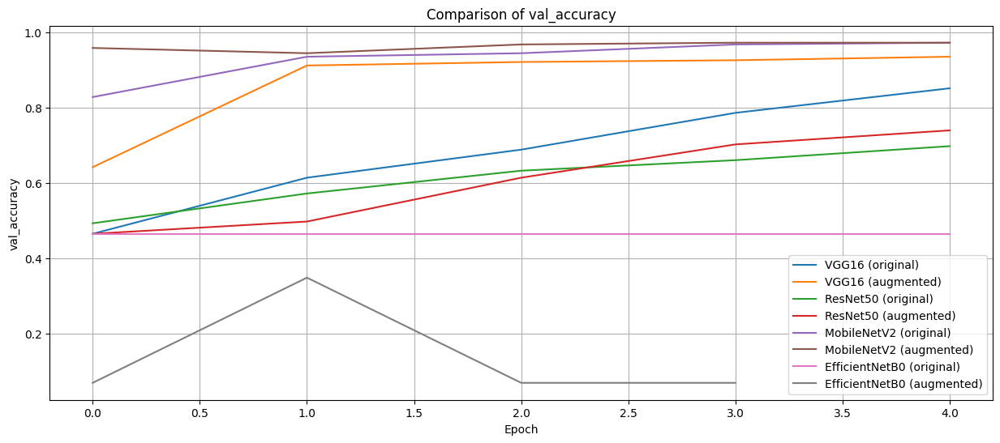

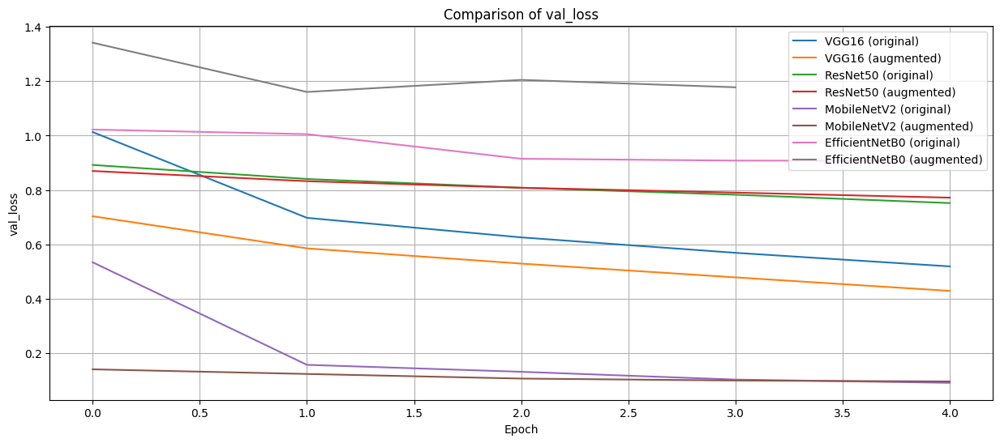

In [ ]:
def plot_all_models_history(results, metric='val_accuracy'):
    plt.figure(figsize=(15, 6))
    for model_name, modes in results.items():
        for mode, data in modes.items():
            label = f"{model_name} ({mode})"
            plt.plot(data["history"][metric], label=label)
    plt.title(f"Comparison of {metric}")
    plt.xlabel("Epoch")
    plt.ylabel(metric)
    plt.legend()
    plt.grid()
    plt.show()

plot_all_models_history(results, metric='val_accuracy')
plot_all_models_history(results, metric='val_loss')

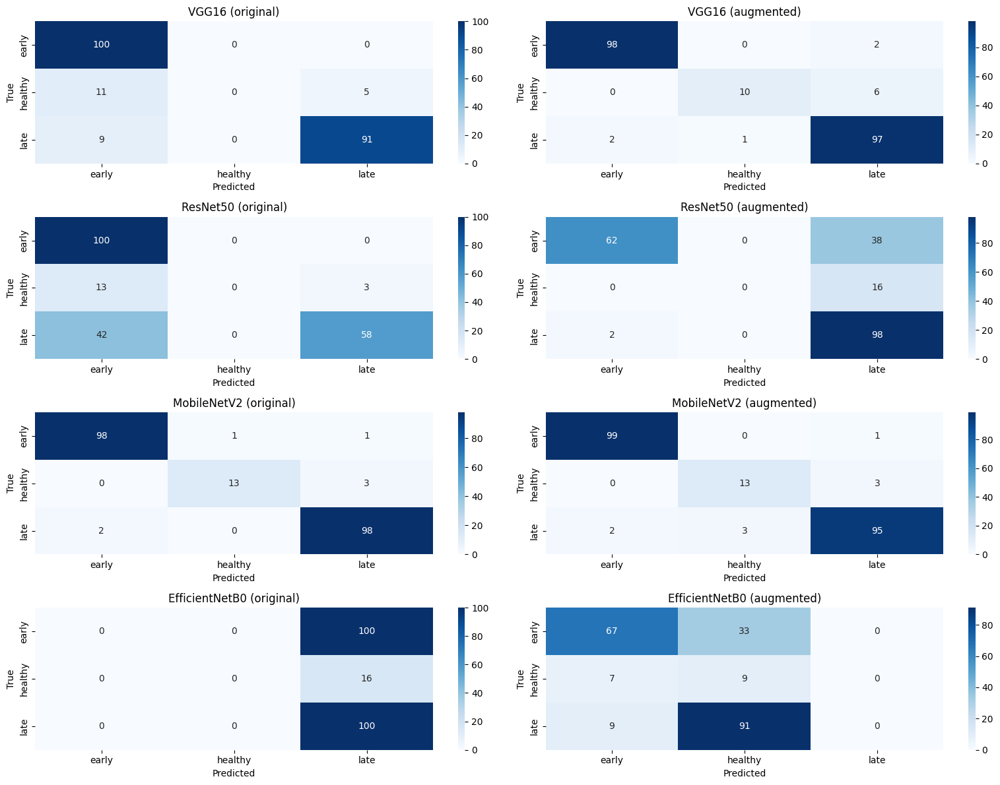

In [ ]:
labels = list(test_gen.class_indices.keys())
plt.figure(figsize=(16, 12))
idx = 1
for model_name, modes in results.items():
    for mode, data in modes.items():
        plt.subplot(4, 2, idx)
        sns.heatmap(data["confusion_matrix"], annot=True, fmt="d", cmap="Blues",
                    xticklabels=labels, yticklabels=labels)
        plt.title(f"{model_name} ({mode})")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        idx += 1

plt.tight_layout()
plt.show()




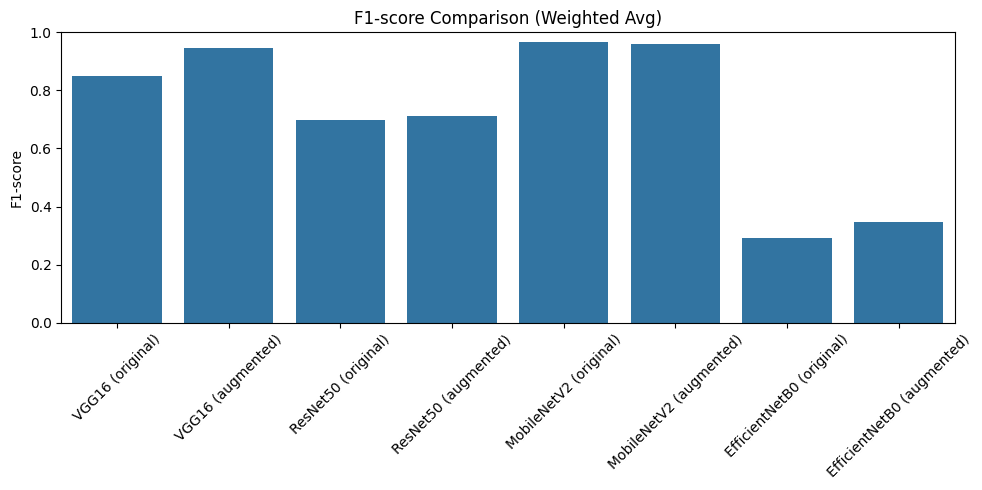

In [ ]:

f1_scores = []
for model_name, modes in results.items():
    for mode, data in modes.items():
        f1 = data["report"]["weighted avg"]["f1-score"]
        f1_scores.append((f"{model_name} ({mode})", f1))

# 바플롯
plt.figure(figsize=(10, 5))
sns.barplot(x=[x[0] for x in f1_scores], y=[x[1] for x in f1_scores])
plt.title("F1-score Comparison (Weighted Avg)")
plt.ylabel("F1-score")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

In [ ]:
def print_classification_reports(results):
    for model_name, modes in results.items():
        for mode, data in modes.items():
            report = data['report']
            weighted = report['weighted avg']
            accuracy = report['accuracy'] if 'accuracy' in report else np.mean([c['recall'] for c in report.values() if isinstance(c, dict)])

            print(f"\n Model: {model_name} ({mode})")
            print(f"Accuracy     : {accuracy:.4f}")
            print(f"Precision    : {weighted['precision']:.4f}")
            print(f"Recall       : {weighted['recall']:.4f}")
            print(f"F1-score     : {weighted['f1-score']:.4f}")


In [ ]:
print_classification_reports(results)



 Model: VGG16 (original)
Accuracy     : 0.8843
Precision    : 0.8247
Recall       : 0.8843
F1-score     : 0.8508

 Model: VGG16 (augmented)
Accuracy     : 0.9491
Precision    : 0.9487
Recall       : 0.9491
F1-score     : 0.9467

 Model: ResNet50 (original)
Accuracy     : 0.7315
Precision    : 0.7389
Recall       : 0.7315
F1-score     : 0.6967

 Model: ResNet50 (augmented)
Accuracy     : 0.7407
Precision    : 0.7470
Recall       : 0.7407
F1-score     : 0.7101

 Model: MobileNetV2 (original)
Accuracy     : 0.9676
Precision    : 0.9673
Recall       : 0.9676
F1-score     : 0.9671

 Model: MobileNetV2 (augmented)
Accuracy     : 0.9583
Precision    : 0.9582
Recall       : 0.9583
F1-score     : 0.9583

 Model: EfficientNetB0 (original)
Accuracy     : 0.4630
Precision    : 0.2143
Recall       : 0.4630
F1-score     : 0.2930

 Model: EfficientNetB0 (augmented)
Accuracy     : 0.3519
Precision    : 0.3787
Recall       : 0.3519
F1-score     : 0.3479


### (기타)모델 저장

In [ ]:

# 저장 디렉토리 지정 (필요시 변경 가능)
save_dir = "/content/saved_models"
os.makedirs(save_dir, exist_ok=True)

for model_name, model_fn in models_to_test.items():
    results[model_name] = {}

    for mode in ["original", "augmented"]:
        print(f"\n Training {model_name} on {mode.upper()} data")

        train_path = "/content/train_augmented" if mode == "augmented" else "/content/train"

        # 데이터 생성기
        train_gen = ImageDataGenerator(rescale=1/255).flow_from_directory(
            train_path, target_size=(224, 224), batch_size=64, class_mode='sparse'
        )

        # 모델 빌드 및 학습
        model = build_model(model_fn)
        history = model.fit(train_gen, validation_data=val_gen, epochs=5,
                            callbacks=[EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)],
                            verbose=1)

        # 평가 및 예측
        y_pred = np.argmax(model.predict(test_gen), axis=1)
        loss_res, accuracy_res = model.evaluate(test_gen)

        print(f"{model_name} accuracy : {accuracy_res}")
        print(f"{model_name} loss : {loss_res}")

        show_predictions(model, test_gen, test_gen.class_indices, num_images=10)

        # 선택 모델만 저장
        if model_name in ["VGG16", "MobileNetV2"]:
            model.save(os.path.join(save_dir, f"{model_name}_{mode}.h5"))
            print(f" Saved {model_name} ({mode}) model to {save_dir}/{model_name}_{mode}.h5")

        # 결과 저장
        results[model_name][mode] = {
            "history": deepcopy(history.history),
            "confusion_matrix": confusion_matrix(test_gen.classes, y_pred),
            "report": classification_report(test_gen.classes, y_pred, output_dict=True)
        }
